In [67]:
import os
import pathlib
import time
import datetime
from matplotlib import pyplot as plt
from IPython import display
import tensorflow as tf
tf.__version__

'2.12.0'

In [68]:
dataset='maps'

In [69]:
dataset_file="{}.tar.gz".format(dataset)
dataset_url="http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/{}".format(dataset_file)
print(dataset_url)

http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/maps.tar.gz


In [70]:
download_zip=tf.keras.utils.get_file(fname=dataset_file,origin=dataset_url,extract=True)

In [71]:
from keras.engine.data_adapter import DatasetAdapter
download_zip=pathlib.Path(download_zip)
path=download_zip.parent/dataset

In [72]:
path

PosixPath('/root/.keras/datasets/maps')

In [73]:
list(path.parent.iterdir())

[PosixPath('/root/.keras/datasets/maps.tar.gz'),
 PosixPath('/root/.keras/datasets/maps')]

In [74]:
sample=tf.io.read_file(str(path/'train/7.jpg'))
sample=tf.io.decode_jpeg(sample)

(600, 1200, 3)


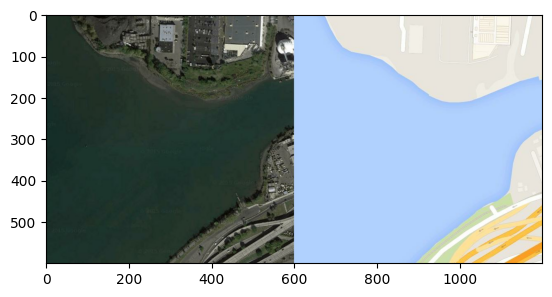

In [75]:
print(sample.shape)
plt.figure()
plt.imshow(sample)

In [76]:
def load_image(img_file):
  img=tf.io.read_file(img_file)
  img=tf.io.decode_jpeg(img)
  img=tf.image.resize(img,[256,512])
  #print(img.shape)
  width=tf.shape(img)[1]
  #print(width)
  width=width//2
  original_img=img[:,:width,:]
  transformed_img=img[:,width:,:]

  original_img=tf.cast(original_img,tf.float32)
  transformed_img=tf.cast(transformed_img,tf.float32)

  return original_img,transformed_img

NameError: ignored

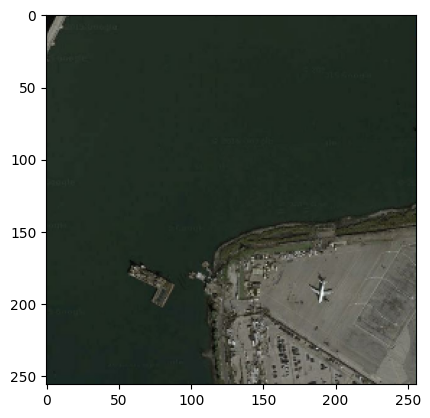

<Figure size 640x480 with 0 Axes>

In [77]:
original_image,transformed_image=load_image(str(path/'train/110.jpg'))
plt.figure()
plt.imshow(original_image/255.0)
plt.figure()
plt.imshow(transformed_img/255.0)

In [ ]:
quantity_training=tf.data.Dataset.list_files(str(path/'train/*.jpg'))
quantity_training

In [ ]:
quantity_training=len(list(quantity_training))
quantity_training

In [ ]:
buffer_size=quantity_training
batch_size=1
img_width=256
img_height=256

In [ ]:
def resize(original_image,transformed_image,width,height):
  original_image=tf.image.resize(original_image,[width,height],method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  transformed_image=tf.image.resize(transformed_image,[width,height],method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  return original_image,transformed_image

In [ ]:
def normalize(original_image,transformed_image):
  original_image=(original_image/127.5)-1
  transformed_image=(transformed_image/127.5)-1
  return original_image,transformed_image

In [78]:
def random_crop(original_image,transformed_image):
  stacked_image=tf.stack([original_image,transformed_image],axis=0)
  crop_img=tf.image.random_crop(stacked_image,size=[2,img_width,img_height,3])
  return crop_img[0],crop_img[1]

In [79]:
tf.random.uniform(())

<tf.Tensor: shape=(), dtype=float32, numpy=0.11554384>

In [80]:
@tf.function()

def random_jitter(original_image,transformed_image):
  original_image,transformed_image=resize(original_image,transformed_image,286,286)
  original_image,transformed_image=random_crop(original_image,transformed_image)
  if tf.random.uniform(())>0.5:
    original_image=tf.image.flip_left_right(original_image)
    transformed_image=tf.image.flip_left_right(transformed_image)
  return original_image,transformed_image

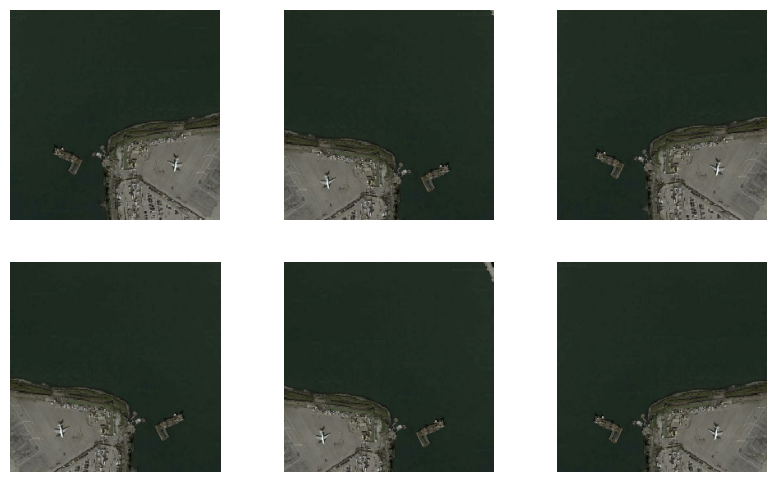

In [81]:
plt.figure(figsize=(10,6))
for i in range(6):
  j_original,j_transformed=random_jitter(original_image,transformed_image)
  plt.subplot(2,3,i+1)
  plt.imshow(j_original/255.0)
  plt.axis('off')
plt.show()



In [82]:
def load_training_images(img_file):
    original_image,transformed_image=load_image(img_file)
    original_image,transformed_image=random_jitter(original_image,transformed_image)
    original_image,transformed_image=normalize(original_image,transformed_image)
    return original_image,transformed_image

In [83]:
training_dataset=tf.data.Dataset.list_files(str(path/'train/*.jpg'))
training_dataset=training_dataset.map(load_training_images,num_parallel_calls=tf.data.AUTOTUNE)
training_dataset=training_dataset.shuffle(buffer_size)
training_dataset=training_dataset.batch(batch_size)

In [84]:
training_dataset

<_BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None))>

In [85]:
def load_testing_images(img_file):
    original_image,transformed_image=load_image(img_file)
    original_image,transformed_image=resize(original_image,transformed_image,img_width,img_height)
    original_image,transformed_image=normalize(original_image,transformed_image)
    return original_image,transformed_image

In [86]:
try:
  testing_dataset=tf.data.Dataset.list_files(str(path/'test/*.jpg'))
except tf.errors.InvalidArgumentError:
  testing_dataset=tf.data.Dataset.list_files(str(path/'val/*.jpg'))
testing_dataset=testing_dataset.map(load_testing_images)
testing_dataset=testing_dataset.batch(batch_size)

In [98]:
##Generator
def encode(filters,size,apply_batchnorm=True):
    initializer=tf.random_normal_initializer(0,0.02)
    result=tf.keras.Sequential()
    result.add(tf.keras.layers.Conv2D(filters,size,strides=2,padding='same',kernel_initializer=initializer,use_bias=True))

    if apply_batchnorm:
       result.add(tf.keras.layers.BatchNormalization())
    result.add(tf.keras.layers.LeakyReLU())
    return result

In [101]:
down_model=encode(3,4)
down_result=down_model(tf.expand_dims(original_image,0))
print(down_result.shape)

(1, 128, 128, 3)


In [103]:
def decode(filters,size,apply_dropout=True):
    initializer=tf.random_normal_initializer(0,0.02)
    result=tf.keras.Sequential()
    result.add(tf.keras.layers.Conv2DTranspose(filters,size,strides=2,padding='same',kernel_initializer=initializer,use_bias=True))

    if apply_dropout:
       result.add(tf.keras.layers.Dropout(0.5))
    result.add(tf.keras.layers.ReLU())
    return result

In [104]:
up_model=decode(3,4)
up_result=up_model(down_result)

In [148]:
def Generator():
  inputs = tf.keras.layers.Input(shape = [256, 256, 3])

  downsampling = [
      encode(64, 4, apply_batchnorm = False), # (batch_size, 128, 128, 64)
      encode(128, 4), # (batch_size, 64, 64, 128)
      encode(256, 4), # (batch_size, 32, 32, 256)
      encode(512, 4), # (batch_size, 16, 16, 512)
      encode(512, 4), # (batch_size, 8, 8, 512)
      encode(512, 4), # (batch_size, 4, 4, 512)
      encode(512, 4), # (batch_size, 2, 2, 512)
      encode(512, 4), # (batch_size, 1, 1, 512)
  ]

  upsampling = [
      decode(512, 4, apply_dropout=True), # (batch_size, 2, 2, 512)
      decode(512, 4, apply_dropout=True), # (batch_size, 4, 4, 512)
      decode(512, 4, apply_dropout=True), # (batch_size, 8, 8, 512)
      decode(512, 4), # (batch_size, 16, 16, 512)
      decode(256, 4), # (batch_size, 32, 32, 256)
      decode(128, 4), # (batch_size, 64, 64, 128)
      decode(64, 4), # (batch_size, 128, 128, 64)
  ]

  output_channels = 3
  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(output_channels, 4, strides=2, padding='same',
                                         kernel_initializer=initializer, activation='tanh') # (batch_size, 256, 256, 3)

  x = inputs
  skips = []
  for down in downsampling:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  for up, skip in zip(upsampling, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs = inputs, outputs = x)


In [149]:
generator=Generator()

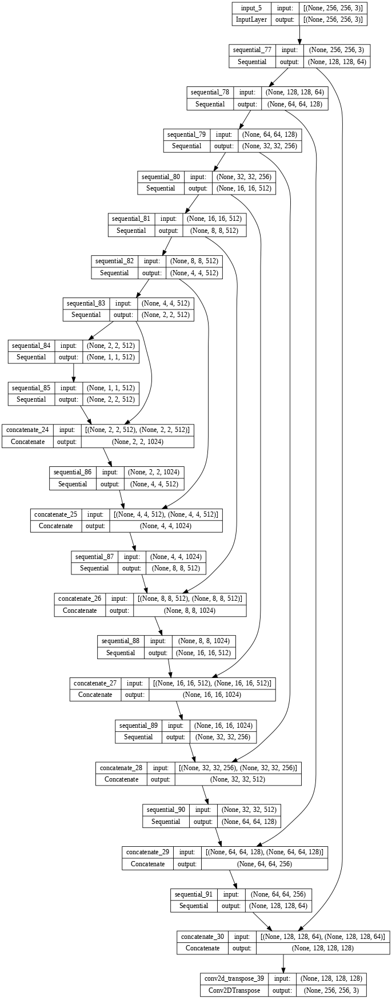

In [150]:
tf.keras.utils.plot_model(generator,show_shapes=True,dpi=64)

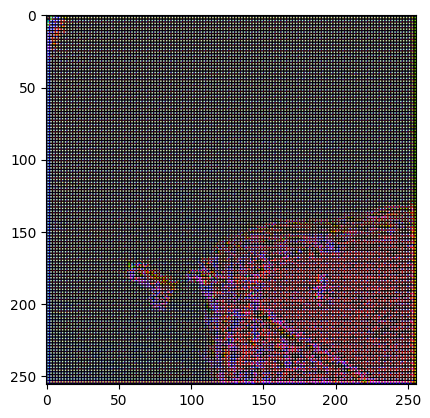

In [151]:
g_output = generator(original_image[tf.newaxis, ...], training=False)
plt.imshow(g_output[0, ...])

In [155]:
lr=0.0002
beta1,beta2=0.4,0.999
lambda_=100

In [117]:
loss=tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [135]:
def generator_loss(d_generated_output,g_output,target):
  gan_loss=loss(tf.ones_like(d_generated_output),d_generated_output)
  l1_loss=tf.reduce_mean(tf.abs(target-g_output)) #MAE
  g_loss_total=gan_loss+(lambda_*l1_loss)
  return g_loss_total,gan_loss,l1_loss

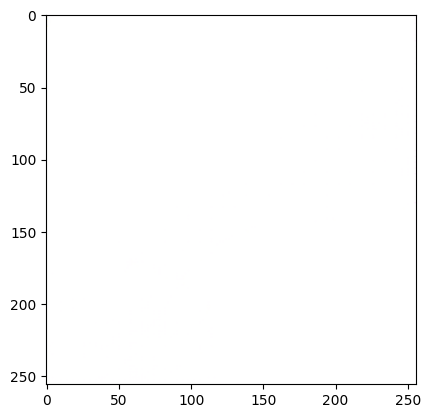

In [134]:
g_output = generator(original_image[tf.newaxis, ...], training=False)
plt.imshow(g_output[0, ...])

In [122]:
from keras.layers.activation.leaky_relu import LeakyReLU
#Discriminator

def Discriminator():
  initializer=tf.random_normal_initializer(0.,0.02)

  original=tf.keras.layers.Input(shape=[256,256,3],name='original_image')
  transformed=tf.keras.layers.Input(shape=[256,256,3],name='transformed_image')
  x=tf.keras.layers.concatenate([original,transformed])#(batch_size,256,256,channels*2)

  down1=encode(64,4,False)(x)#(batch_size,128,128,64)
  down2=encode(128,4)(down1) #(batch_size,64,64,128)
  down3=encode(256,4)(down2) #(batch_size,32,32,126)

  zero_pad1=tf.keras.layers.ZeroPadding2D()(down3) #batch_size,34,34,256
  conv=tf.keras.layers.Conv2D(512,4,strides=1,kernel_initializer=initializer,use_bias=False)(zero_pad1) #batch_size 31,31,512
  batchnorm1=tf.keras.layers.BatchNormalization()(conv)
  leaky_relu=tf.keras.layers.LeakyReLU()(batchnorm1)
  zero_pad2=tf.keras.layers.ZeroPadding2D()(leaky_relu)
  last=tf.keras.layers.Conv2D(1,4,strides=1,kernel_initializer=initializer)(zero_pad2)#batch_size 30,30,1

  return tf.keras.Model(inputs=[original,transformed],outputs=last)

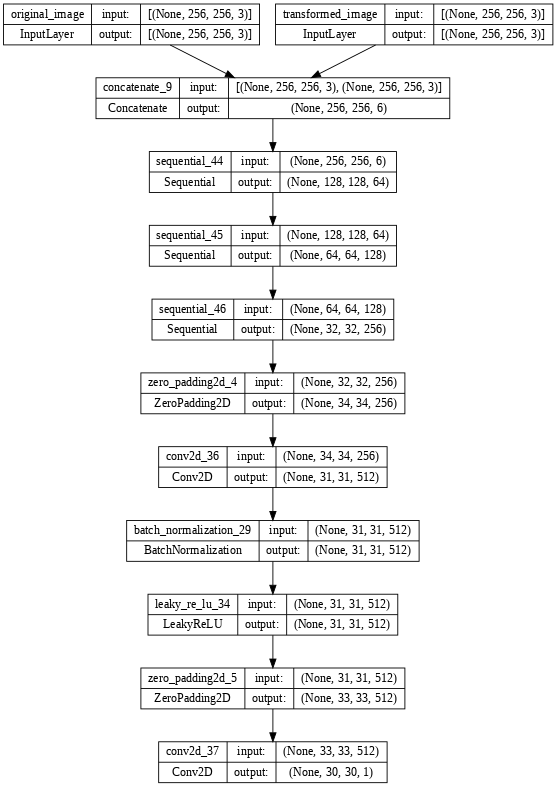

In [124]:
discriminator=Discriminator()
tf.keras.utils.plot_model(discriminator,show_shapes=True,dpi=64)


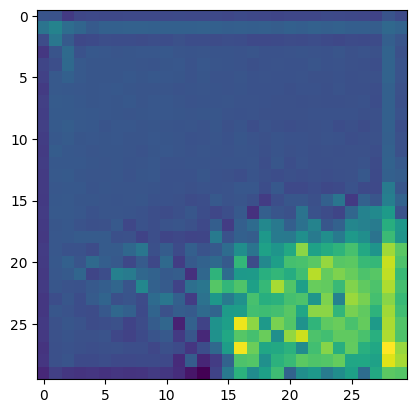

In [132]:
d_output=discriminator([original_image[tf.newaxis,...],g_output],training=False)
plt.imshow(d_output[0,...])

In [152]:
def discriminator_loss(d_real_output,d_generated_output):
  real_loss=loss(tf.ones_like(d_real_output),d_real_output)
  generated_loss=loss(tf.ones_like(d_generated_output),d_generated_output)
  d_total_loss=real_loss + generated_loss
  return d_total_loss

In [157]:
##OPTIMIZERS

generator_optimizer=tf.keras.optimizers.Adam(lr,beta_1=beta1,beta_2=beta2)
discriminator_optimizer=tf.keras.optimizers.Adam(lr,beta_1=beta1,beta_2=beta2)

In [158]:
#Model Checkpoint

checkpoint_dir='./training_checkpoints'
checkpoint_prefix=os.path.join(checkpoint_dir,"chpt")
checkpoint=tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                               discriminator_optimizer=discriminator_optimizer,
                               generator=generator,
                               discriminator=discriminator
                               )

In [159]:
def generated_images(model,test_input,real,step=None):
  generated_img=model(test_input,training=False)
  plt.figure(figsize=(12,8))

  img_list=[test_input[0],real[0],generated_img[0]]
  title=['Input Image','Real Image', "Generated Image"]

  for i in range(3):
    plt.subplot(1,3,i+1)
    plt.title(title[i])
    plt.imshow(img_list[i]*0.5+0.5)
    plt.axis('off')

  if step is not None:
    plt.savefig('result_pix2pix_step_{}.png'.format(step),bbox_inches='tight')

  plt.show()

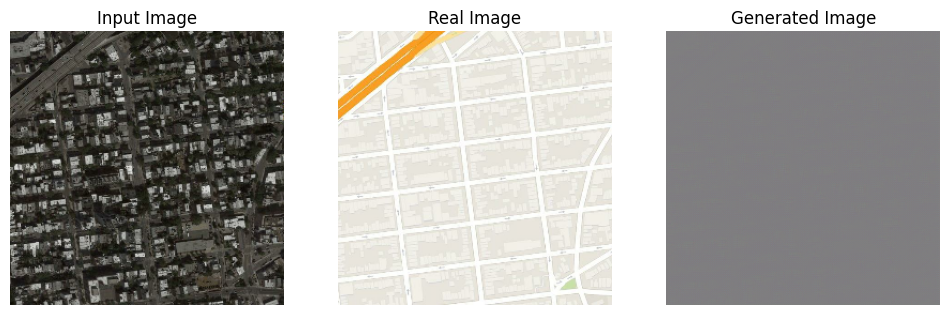

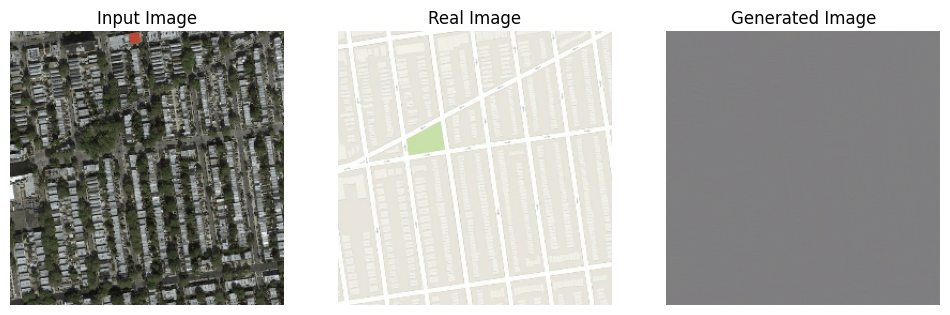

In [162]:
for input_example,real_example in testing_dataset.take(2):
  generated_images(generator,input_example,real_example)

In [163]:
path_log='logs/'
metrics=tf.summary.create_file_writer(path_log+'fit/'+datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [174]:
@tf.function

def training_step(input_img,real,step):
  with tf.GradientTape() as g_tape, tf.GradientTape() as d_tape:
    g_output=generator(input_img,training=True)

    d_output_real=discriminator([input_img,real],training=True)
    d_output_generated=discriminator([input_img,g_output],training=True)

    g_total_loss,g_loss_gan,g_loss_l1=generator_loss(d_output_generated,g_output,real)
    d_loss=discriminator_loss(d_output_real,d_output_generated)

  generator_gradients=g_tape.gradient(g_total_loss,generator.trainable_variables)
  discriminator_gradients=d_tape.gradient(d_loss,discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,discriminator.trainable_variables))


  with metrics.as_default():
    tf.summary.scalar('g_total_loss',g_total_loss,step=step//1000)
    tf.summary.scalar('d_loss_gan',g_loss_gan,step=step//1000)
    tf.summary.scalar('g_loss_l1',g_loss_l1,step=step//1000)
    tf.summary.scalar('d_loss',d_loss,step=step//1000)


In [175]:
def train(training_dataset,testing_dataset,steps):
  test_input,real_input=next(iter(testing_dataset.take(1)))
  start=time.time()

  for step,(input_img,real_img) in training_dataset.repeat().take(steps).enumerate():
    if step%1000==0:
      display.clear_output(wait=True)
      if step!=0:
        print(f'Time taken to run 1000 steps:{time.time()-start:.2f} seconds/n' )
      start=time.time()
      generated_images(generator,test_input,real_input,step)
      print(f'Step:{step//1000}K')
    training_step(input_img,real_img,step)
    if(step+1)%10==0:
      print('.',end='',flush=True)
    if (step+1)%5000==0:
      checkpoint.save(file_prefix=checkpoint_prefix)
      generator.save_weights('model_pix2pix.h5')

In [176]:
%load_ext tensorboard
%tensorboard --logdir {path_log}

Output hidden; open in https://colab.research.google.com to view.

Time taken to run 1000 steps:96.95 seconds/n


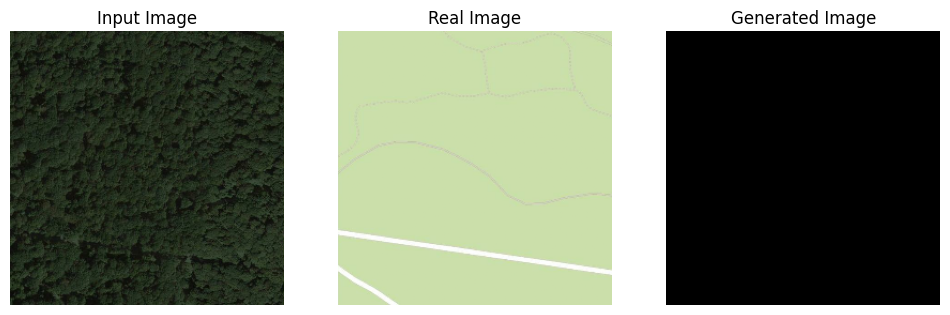

Step:4K
......................................

KeyboardInterrupt: ignored

In [177]:
train(training_dataset,testing_dataset,steps=20000)#40000

In [ ]:
tf.train.latest_checkpoint(checkpoint_dir)


In [ ]:
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))